# Exploring unemployment in Europe in general and CH in particular

We are looking at unemployment rates (an ill-defined term) in Europe vis-à-vis Switzerland and looking at how we may comment on it.

In [1]:
import os
import pandas as pd
import numpy as np
import json
import folium
import glob
import csv
import string

## Q1 : Europe

### Looking at the map of Europe : using a new `geojson` file
Our `topojson` file is replaced by `geojson` by removing some irrelevant countries (who counts Israel and a vivisected Russia in Europe anyway? And most of the Balkan nations as well as ex-Soviet Union is ignored) which we did [from this site](http://geojson.io/#map=2/20.0/0.0).

In [2]:
#import geo map
geo_europe_loc = open('geojson/europe.geojson')
geo_europe = json.loads(geo_europe_loc.read())

m = folium.Map(location=[54,20], zoom_start=3.5)
folium.GeoJson(geo_europe, name='Map of European nations').add_to(m)

m

### Collecting the dataset for Europe

We look at the website of [eurostat](http://ec.europa.eu/eurostat/data/database) and find a dataset which tells us of unemployment rates in Europe (majorly the European Union, but also some other nations in the continent of Europe). We look at a dataset called _'Unemployment rates by sex and age, annual average'_ (`une_rt_a`)

They have a very clear definition of the unemployment rate. 
> _Unemployed persons are all persons 15 to 74 years of age (16 to 74 years in ES, IT and the UK) who were not employed during the reference week, had actively sought work during the past four weeks and were ready to begin working immediately or within two weeks. Employed persons are all persons who worked at least one hour for pay or profit during the reference week or were temporarily absent from such work. The unemployment rate is the number of people unemployed as a percentage of the labour force. The labour force is the total number of people employed and unemployed._

Although how good that definition is needs discussion, which we will do later for the case of Switzerland.

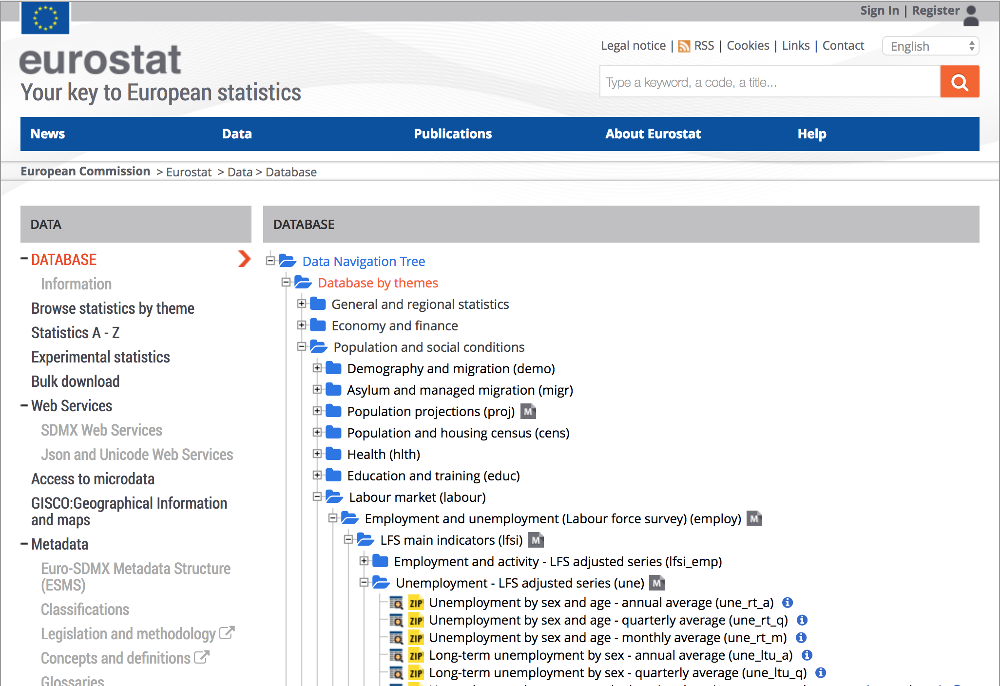

In [3]:
from IPython.display import Image
Image(filename='./eurostat_data.png',width=600,height=600)

### A bit of preprocessing
We present this data from this `une_rt_a` in a `choropleth` map. Let us look at the latest complete year (2016). Preprocessing involves replacing the id's of Greece and the UK, because they are GR and GB in our `json` file while they are EL and UK in the datafile, which we checked by loading the `geojson` file and checking the id's, but we do not run here and show the code.
```python
for country in geo_europe['features']:
    print(country['id'],country['properties']['NAME'])
    
...
GR Greece
GB United Kingdom
...

```

In [4]:
# import data
eu_unemployment = os.path.join('./une_rt_a/', 'une_rt_a_1_Data.csv')
eu_unemployment_data = pd.read_csv(eu_unemployment)

# clean data
eu_unemployment_data = eu_unemployment_data.loc[(eu_unemployment_data['TIME']==2016)].drop(['UNIT','SEX'],axis=1)
eu_unemployment_data['Value'] = eu_unemployment_data['Value'].apply(pd.to_numeric)
eu_unemployment_data = eu_unemployment_data.replace(['EL','UK'],['GR','GB'])

# display head
eu_unemployment_data.head()

,TIME,GEO,GEO_LABEL,AGE,Value
496,2016,BE,Belgium,Total,7.8
497,2016,BG,Bulgaria,Total,7.6
498,2016,CZ,Czech Republic,Total,4.0
499,2016,DK,Denmark,Total,6.2
500,2016,DE,Germany (until 1990 former territory of the FRG),Total,4.1


### Making the `choropleth` map
We now look at how the unemployment is distributed to see how the threshold should be.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10c678c18>]], dtype=object)

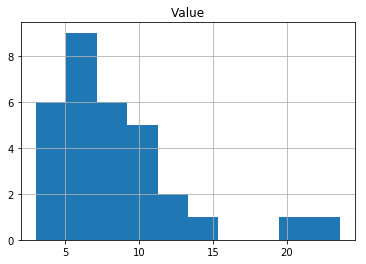

In [5]:
%matplotlib inline
eu_unemployment_data.hist(column='Value')

It is quite heavy at low rates and so maybe quantiles would be a good way to put the threshold, and we see that the function `choropleth` in `folium` does just that. So we decide not to use an equal threshold scale. 

The `Layer` function allows one to change what one wants to see on the map by ticking the `Features` layers. We can choose between wanting to see the countries by clicking on 'Maps of European nations' and the unemployment rates using 'Unemployment rates (%) in Europe'. The data for Switzerland is missing, but it is found out as explained later. In 2016, the unemplyment rate, defined in a slightly different manner than the rest of Europe is defined to be 3.31%. We put it in the map by adding to the `DataFrame` but be careful about the definitions. It will give only a rough comparison.

In [6]:
eu_unemployment_data = eu_unemployment_data.append({'TIME':2016,\
                                                    'GEO':'CH',\
                                                    'GEO_LABEL':'Switzerland',\
                                                    'AGE':'Total',\
                                                    'Value':3.3},ignore_index=True)

In [7]:
# threshold_scale = np.linspace(eu_unemployment_data['Value'].min(),eu_unemployment_data['Value'].max(), 6, dtype=int).tolist()
# print(threshold_scale)

m = folium.Map(location=[54,20], zoom_start=3.5)

folium.GeoJson(geo_europe, name='Maps of European nations').add_to(m)

m.choropleth(
    name = 'Unemployment rates (%) in Europe',
    geo_data= geo_europe,
    data= eu_unemployment_data,
    columns= ['GEO', 'Value'],
    key_on= 'feature.id',
    fill_color='OrRd',
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name='Unemployment rates (%) in Europe'
    
)

folium.Marker([46.5,8],
              popup = 'CH 3.31%',
              icon=folium.Icon(color='red',icon='plus-sign')
             ).add_to(m)
folium.LayerControl().add_to(m)

m

##  Q2 : Switzerland/Suisse/Schweiz/Svizzera/Svizra : Defining unemployment

### Canton wise unemployment rate

For the second task we have downloaded from the amstat website a dataset that includes the rates of unemployed people for the last 15 years, as well as other information. Specifically, we look at:

* Registered unemployed
* Registered job seekers
* Job seekers with a job 

For our analysis we choose to keep only the fraction of people as "People who are jobless, looking for a job, and available for work". That is, the number of registered job seekers minus the ones who have already a job. We can easily see that this number corresponds to the registered unemployed people. We consider important to check this difference to exclude the possbility that the "registered unemployed" class includes jobless people that are not looking for a job (and that thus don't belong to our definition of unemployment). Given the premise, since the information about "Registered job seekers" is redundant, we decide to exclude it from our dataset.

Moreover, we are interested in the unemployment rate. It is the number of unemployed people divided by the number of people in the labor force. Neverthless, in our dataset it seems to be computed as the number of registered unemployed people over the employed ones.

In [8]:
# Import & read geo & rate data
ch_geo = os.path.join('./topojson/', 'ch-cantons.topojson.json')
ch_rate = os.path.join('./ch_rate.xlsx')
ch_rate_data = pd.read_excel(ch_rate, index=False)

### Cleaning data

The first objective is to group the different categories by year and rename the data properly. We see that the columns are serially arranged by rate, registered unemployed and job seekers with a job, according to months, and so we slice the data sequentially and aggregrate them to get the average annual values.

In [9]:
# Clean 

# Slice the data and get the mean of all months (yearly mean)
ch_rate_data = ch_rate_data.iloc[1:,:]
for year in np.arange(0,15,1):
    rate_data = pd.DataFrame({'rate_ue_{}'.format(year+2002): ch_rate_data.iloc[:,(1+36*year):(1+36*(year+1)-1):3].apply(pd.to_numeric).mean(axis=1)})
    reg_ue_data = pd.DataFrame({'reg_ue_{}'.format(year+2002): ch_rate_data.iloc[:,(2+36*year):(2+36*(year+1)-1):3].apply(pd.to_numeric).mean(axis=1)})
    js_with_job = pd.DataFrame({'js_with_job_{}'.format(year+2002): ch_rate_data.iloc[:,(3+36*year):(3+36*(year+1)-1):3].apply(pd.to_numeric).mean(axis=1)})
    ch_rate_data = pd.concat((ch_rate_data,rate_data,reg_ue_data,js_with_job),axis=1)

    
# Delete the monthly data    
beginning_of_dataset = ch_rate_data.iloc[:,:1]
end_of_dataset = ch_rate_data.iloc[:,-45:]
ch_rate_data = pd.concat((beginning_of_dataset,end_of_dataset),axis=1)

# To not consider part-humans...
ch_rate_data.iloc[:,2::3] = ch_rate_data.iloc[:,2::3].astype(int)
ch_rate_data.iloc[:,3::3] = ch_rate_data.iloc[:,3::3].astype(int)

In [10]:
# Show
ch_rate_data.head()

,Kanton,rate_ue_2002,reg_ue_2002,js_with_job_2002,rate_ue_2003,reg_ue_2003,js_with_job_2003,rate_ue_2004,reg_ue_2004,js_with_job_2004,...,js_with_job_2013,rate_ue_2014,reg_ue_2014,js_with_job_2014,rate_ue_2015,reg_ue_2015,js_with_job_2015,rate_ue_2016,reg_ue_2016,js_with_job_2016
1,Zürich,2.991667,21595,7283,4.516667,32574,9444,4.483333,32402,10368,...,5790,3.175000,26013,5923,3.416667,27985,6232,3.650000,30083,6702
2,Bern,1.750000,9162,5155,2.833333,14860,6651,2.916667,15212,7452,...,4514,2.350000,13189,4866,2.500000,14116,4922,2.708333,15283,4801
3,Luzern,2.000000,3780,1560,3.116667,5881,2334,3.141667,5955,2676,...,2489,1.866667,4147,2435,1.975000,4383,2643,2.058333,4601,2864
4,Uri,0.716667,124,169,1.066667,188,181,1.183333,208,200,...,182,1.050000,202,148,1.033333,199,163,1.041667,201,161
5,Schwyz,1.225000,878,730,2.108333,1490,1034,2.283333,1630,1019,...,773,1.525000,1344,794,1.583333,1388,758,1.766667,1537,752


### Looking at Switzerland

Our next step is to use `folium` to visualize Swiss cantons and assign the corresponding unemployment rates.
Notice that we have downloaded the data in German in order to better match the names of the cantons with the ones provided in the geographical data.

In [11]:
#Loading
ch_geo_source = open('geojson/switzerland.geojson')
ch_geo_json = ch_geo_source.read()
ch_geo = json.loads(ch_geo_json)

# create empty map zoomed in Switzerland
ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)
folium.GeoJson(ch_geo, name='Map of Swiss cantons').add_to(ch_map)

#Visualize
ch_map

### Plotting canton-wise unemployment rate

Please note the 'stacked layers' button on the top right which can be clicked to interactively select which layer to show on the map.

In [12]:
# Show data in the map
ch_map.choropleth(name = 'Unemployment rates (%) in the Swiss cantons',
                  geo_data=ch_geo, 
                  data=ch_rate_data,
                  columns=['Kanton', 'rate_ue_2016'],
                  key_on='feature.properties.name',
                  fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
                  legend_name='Unemployment rate (%)')
folium.LayerControl().add_to(ch_map)
ch_map

In the previous analysis we considered only the unemployed people looking for a job. If we want to look at the overall population looking for a job, we have to consider also those job seekers who already have a job.
Since the rates for this group are not provided, we will calculate them as the number of job seekers over the employed population. We assume that the "Unemployment rate" has been computed from the "Registered unemployed" data and thus we will use this information to derive the number of employed people for each canton.

`(unemployment rate) = (num. of unemployed) / (active population)`

or

`(active population) = (num. of unemployed) / (unemployment rate)`

In [13]:
# Compute labor force  2016
ch_rate_data['emp_2016'] = ch_rate_data['reg_ue_2016'] / ch_rate_data['rate_ue_2016'] 

In [14]:
# Compute job seekers / labor force  2016
ch_rate_data['rate_js_with_job_2016'] = ch_rate_data['js_with_job_2016'] / ch_rate_data['emp_2016']
ch_rate_data.head()

,Kanton,rate_ue_2002,reg_ue_2002,js_with_job_2002,rate_ue_2003,reg_ue_2003,js_with_job_2003,rate_ue_2004,reg_ue_2004,js_with_job_2004,...,reg_ue_2014,js_with_job_2014,rate_ue_2015,reg_ue_2015,js_with_job_2015,rate_ue_2016,reg_ue_2016,js_with_job_2016,emp_2016,rate_js_with_job_2016
1,Zürich,2.991667,21595,7283,4.516667,32574,9444,4.483333,32402,10368,...,26013,5923,3.416667,27985,6232,3.650000,30083,6702,8241.917808,0.813160
2,Bern,1.750000,9162,5155,2.833333,14860,6651,2.916667,15212,7452,...,13189,4866,2.500000,14116,4922,2.708333,15283,4801,5642.953846,0.850796
3,Luzern,2.000000,3780,1560,3.116667,5881,2334,3.141667,5955,2676,...,4147,2435,1.975000,4383,2643,2.058333,4601,2864,2235.303644,1.281258
4,Uri,0.716667,124,169,1.066667,188,181,1.183333,208,200,...,202,148,1.033333,199,163,1.041667,201,161,192.960000,0.834370
5,Schwyz,1.225000,878,730,2.108333,1490,1034,2.283333,1630,1019,...,1344,794,1.583333,1388,758,1.766667,1537,752,870.000000,0.864368


Below, too, we can select one of two definitions of unemployment and show how the two differ. The colours used are different and if we choose the low opacity one on top of the high, we can visualise which canton is the most different in terms of unemployment as defined by both the definitions. 

In [15]:
# create empty map zoomed in Switzerland
ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)

#Add new rate data to the map
ch_map.choropleth(name = 'Old way unemployment rates (%) in the Swiss cantons',
                  geo_data=ch_geo, 
                  data=ch_rate_data,
                  columns=['Kanton', 'rate_ue_2016'],
                  key_on='feature.properties.name',
                  fill_color='OrRd', 
                  fill_opacity=0.7, 
                  line_opacity=0.2,
                  legend_name='Old unemployment rate (%)')
#Add new rate data to the map
ch_map.choropleth(name = 'New way unemployment rates (%) in the Swiss cantons',
                  geo_data=ch_geo, 
                  data=ch_rate_data,
                  columns=['Kanton', 'rate_js_with_job_2016'],
                  key_on='feature.properties.name',
                  fill_color='PuBu', 
                  fill_opacity=0.3, 
                  line_opacity=0.2,
                  legend_name='New unemployment rate (%)')

folium.LayerControl().add_to(ch_map)
ch_map


### Looking at another category (removing young people)

We now look at a similar kind of analysis but by looking at removing young people from our dataset to calculate the unemployment rates. 

In [16]:
# We take a look at the dataset where unemployment is registered by age group
ch_rate_data_byAge = pd.read_excel('ch_age.xlsx').iloc[1:,:]
ch_rate_data_byAge.head()

# Average by year, similar as before
ch_rate_data_byAge_yearly = pd.DataFrame()
for year in np.arange(0,15,1):
    rate_data = pd.DataFrame({'rate_ue_{}'.format(year+2002): ch_rate_data_byAge.iloc[:,(3+36*year):(3+36*(year+1)-1):3].apply(pd.to_numeric, errors='coerce').mean(axis=1)})
    reg_ue_data = pd.DataFrame({'reg_ue_{}'.format(year+2002): ch_rate_data_byAge.iloc[:,(4+36*year):(4+36*(year+1)-1):3].apply(pd.to_numeric, errors='coerce').mean(axis=1)})
    js_with_job = pd.DataFrame({'js_with_job_{}'.format(year+2002): ch_rate_data_byAge.iloc[:,(5+36*year):(5+36*(year+1)-1):3].apply(pd.to_numeric, errors='coerce').mean(axis=1)})
    ch_rate_data_byAge_yearly = pd.concat((ch_rate_data_byAge_yearly,rate_data,reg_ue_data,js_with_job),axis=1)
ch_rate_data_byAge_yearly.head()

,rate_ue_2002,reg_ue_2002,js_with_job_2002,rate_ue_2003,reg_ue_2003,js_with_job_2003,rate_ue_2004,reg_ue_2004,js_with_job_2004,rate_ue_2005,...,js_with_job_2013,rate_ue_2014,reg_ue_2014,js_with_job_2014,rate_ue_2015,reg_ue_2015,js_with_job_2015,rate_ue_2016,reg_ue_2016,js_with_job_2016
1,3.283333,3218.750000,827.916667,5.408333,5307.333333,1203.000000,5.683333,5565.166667,1455.833333,5.450000,...,534.250000,3.500000,3214.750000,539.750000,3.841667,3523.833333,523.333333,4.041667,3711.416667,534.250000
2,3.225000,14273.666667,4584.000000,4.791667,21170.250000,5955.916667,4.600000,20297.916667,6360.833333,3.991667,...,3580.166667,3.350000,16715.583333,3630.166667,3.575000,17918.666667,3798.583333,3.841667,19181.750000,4097.833333
3,2.241667,4103.333333,1871.500000,3.350000,6096.750000,2285.750000,3.575000,6539.083333,2551.833333,3.308333,...,1676.416667,2.658333,6082.833333,1753.666667,2.858333,6542.833333,1911.000000,3.133333,7190.750000,2069.916667
4,2.216667,1700.000000,657.416667,4.041667,3083.666667,1037.583333,4.175000,3192.250000,1132.916667,4.141667,...,390.500000,2.650000,1922.583333,412.916667,2.800000,2035.500000,432.916667,2.908333,2111.083333,440.333333
5,1.833333,5714.916667,3155.500000,2.883333,9013.250000,4038.916667,2.908333,9066.333333,4443.500000,2.783333,...,2686.000000,2.516667,7790.833333,2924.500000,2.666667,8274.500000,2891.916667,2.891667,8947.250000,2796.083333


In [17]:
# To not consider part-humans...
ch_rate_data_byAge_yearly.iloc[:,1::3] = ch_rate_data_byAge_yearly.iloc[:,1::3].fillna(0).astype(int)
ch_rate_data_byAge_yearly.iloc[:,1::3] = ch_rate_data_byAge_yearly.iloc[:,1::3].fillna(0).astype(int)

In [18]:
ch_rate_data_byAge = pd.concat([ch_rate_data_byAge.iloc[:,:2], ch_rate_data_byAge_yearly], axis=1)
ch_rate_data_byAge.head()

,Kanton,"Altersklassen 15-24, 25-49, 50 und mehr",rate_ue_2002,reg_ue_2002,js_with_job_2002,rate_ue_2003,reg_ue_2003,js_with_job_2003,rate_ue_2004,reg_ue_2004,...,js_with_job_2013,rate_ue_2014,reg_ue_2014,js_with_job_2014,rate_ue_2015,reg_ue_2015,js_with_job_2015,rate_ue_2016,reg_ue_2016,js_with_job_2016
1,Zürich,1.0,3.283333,3218.0,827.916667,5.408333,5307.0,1203.000000,5.683333,5565.0,...,534.250000,3.500000,3214.0,539.750000,3.841667,3523.0,523.333333,4.041667,3711.0,534.250000
2,Zürich,2.0,3.225000,14273.0,4584.000000,4.791667,21170.0,5955.916667,4.600000,20297.0,...,3580.166667,3.350000,16715.0,3630.166667,3.575000,17918.0,3798.583333,3.841667,19181.0,4097.833333
3,Zürich,3.0,2.241667,4103.0,1871.500000,3.350000,6096.0,2285.750000,3.575000,6539.0,...,1676.416667,2.658333,6082.0,1753.666667,2.858333,6542.0,1911.000000,3.133333,7190.0,2069.916667
4,Bern,1.0,2.216667,1700.0,657.416667,4.041667,3083.0,1037.583333,4.175000,3192.0,...,390.500000,2.650000,1922.0,412.916667,2.800000,2035.0,432.916667,2.908333,2111.0,440.333333
5,Bern,2.0,1.833333,5714.0,3155.500000,2.883333,9013.0,4038.916667,2.908333,9066.0,...,2686.000000,2.516667,7790.0,2924.500000,2.666667,8274.0,2891.916667,2.891667,8947.0,2796.083333


In [19]:
# The total active population is registered_unemployed/unemployment_rate
tot_population = []
unemployed_groups23 = [] # Unemployed people aged over 25
Kantons = []
for i in range(0,77,3):
    group1 = ch_rate_data_byAge.iloc[i,45]/(ch_rate_data_byAge.iloc[i,44]/100)
    group2 = ch_rate_data_byAge.iloc[i+1,45]/(ch_rate_data_byAge.iloc[i+1,44]/100)
    group3 = ch_rate_data_byAge.iloc[i+2,45]/(ch_rate_data_byAge.iloc[i+2,44]/100)
    tot_population.append(group1+group2+group3)
    group2_unemp = ch_rate_data_byAge.iloc[i+1,45]
    grou3_unemp = ch_rate_data_byAge.iloc[i+2,45]
    unemployed_groups23.append(group2_unemp+grou3_unemp)
    Kantons.append(ch_rate_data_byAge.iloc[i,0])

In [20]:
# Unemployment rate for people over 25
unemploymentRate_group2and3 = pd.DataFrame(np.array(unemployed_groups23)/np.array(tot_population), columns=['Rate'])

In [21]:
unemploymentRate_group2and3 = pd.concat([pd.DataFrame(Kantons, columns=['Kantons']),unemploymentRate_group2and3], axis=1)

In [22]:
unemploymentRate_group2and3.head()

,Kantons,Rate
0,Zürich,0.032137
1,Bern,0.023420
2,Luzern,0.017295
3,Uri,0.009169
4,Schwyz,0.015598


In [23]:
# create empty map zoomed in Switzerland
ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)
#Add rate data to the map
ch_map.choropleth(name = 'Unemployment rate for non-young people',geo_data=ch_geo, data=unemploymentRate_group2and3,
             columns=['Kantons', 'Rate'],
             key_on='feature.properties.name',
             fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Unemployment rate for people over 25 (%)')
folium.LayerControl().add_to(ch_map)
ch_map

## Q3. CH : Canton wise unemployment rate by nationality & age

For this task we have downloaded different datasets that include the unemployment rates in Switzerland divided by cathegories, in particular:

* Swiss v/s foreign workers
* Three age groups: 15-24, 25-49, 50+, which we call respectively, `age_1`, `age_2`, `age_3`

In [24]:
#Import rate data by nationality & age
ch_nationality = os.path.join('./ch_nationality.xlsx')
ch_age = os.path.join('./ch_age.xlsx') #not used - delete?
ch_age_nat_total = os.path.join('./ch_age_nat_total.xlsx')

#Read
ch_nationality_data = pd.read_excel(ch_nationality, index=False)
ch_age_data = pd.read_excel(ch_age, index=False) #not used - delete?
ch_age_nat_total_data = pd.read_excel(ch_age_nat_total, index=False)

#Clean 
ch_nationality_data = ch_nationality_data.iloc[1:,:]
ch_age_data = ch_age_data.iloc[1:,:] #not used - delete?
ch_age_nat_total_data = ch_age_nat_total_data.iloc[1:,:]

### Division by nationality

This time we only keep rates from 2016 since we are only interested in recent data. 

In [25]:
# Group by year
year=14 #2016
rate_data = pd.DataFrame({'rate_ue_by_nat_{}'.format(year+2002): ch_nationality_data.iloc[:,(2+36*year):(2+36*(year+1)-1):3].apply(pd.to_numeric).mean(axis=1)})

# Make a single dataset keeping only useful information
beginning_of_dataset = ch_nationality_data.iloc[:,:2]
ch_nationality_data = pd.concat((beginning_of_dataset,rate_data),axis=1)

ch_nationality_data.head()   

,Kanton,Nationalität,rate_ue_by_nat_2016
1,Zürich,Ausländer,6.008333
2,Zürich,Schweizer,2.775000
3,Bern,Ausländer,6.533333
4,Bern,Schweizer,2.000000
5,Luzern,Ausländer,4.683333


We re-index the data, this way we have easy access to both groups.

In [26]:
ch_nationality_data = ch_nationality_data.set_index(['Nationalität'])
ch_nationality_data.head()

,Kanton,rate_ue_by_nat_2016
Nationalität,,
Ausländer,Zürich,6.008333
Schweizer,Zürich,2.775000
Ausländer,Bern,6.533333
Schweizer,Bern,2.000000
Ausländer,Luzern,4.683333


In [27]:
g_swiss = ch_nationality_data.loc['Schweizer'].reset_index().drop(['Nationalität'], axis=1)
g_foreigners = ch_nationality_data.loc['Ausländer'].reset_index().drop(['Nationalität'], axis=1)

Let's create a new map and add the data. This time we have to think about a way to show 2 datasets.

In [28]:
# create new empty map zoomed in Switzerland
ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)
#Add rate data to the map - for Swiss people
ch_map.choropleth(name='Unemployment rate - Swiss people (%)',
                  geo_data=ch_geo, data=g_swiss,
             columns=['Kanton', 'rate_ue_by_nat_2016'],
             key_on='feature.properties.name',
             fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Unemployment rate - Swiss people (%)')

#Add rate data to the map - for Swiss people
ch_map.choropleth(name='Unemployment rate - foreigners (%)',
                  geo_data=ch_geo, data=g_foreigners,
             columns=['Kanton', 'rate_ue_by_nat_2016'],
             key_on='feature.properties.name',
             fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Unemployment rate - foreigners (%)')

folium.LayerControl().add_to(ch_map)
ch_map

The previous map let us visualise both the unemployment rates based on their nationality by switching from one group to the other. Nevertheless, looking at the two maps we cannot see immediately the discrepancy between Swiss and foreigners. We would like to know for example which of the cantons has a wider gap between the two nationality groups. If instead we plot the difference in rates between the two groups for each canton, this information becomes immediately clear. 

In [29]:
# Compute difference
rate_difference_nat =  g_foreigners['rate_ue_by_nat_2016'] - g_swiss['rate_ue_by_nat_2016']

# Create dataframe with cantons (take vector from previous dataset)
ch_difference_nat_data = pd.concat((ch_rate_data['Kanton'].reset_index().drop(['index'],axis=1),rate_difference_nat),axis=1)

ch_difference_nat_data.head()

,Kanton,rate_ue_by_nat_2016
0,Zürich,3.233333
1,Bern,4.533333
2,Luzern,3.208333
3,Uri,3.625000
4,Schwyz,2.708333


In [30]:
# create new empty map zoomed in Switzerland
ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)

#Add rate data to the map - for Swiss people
ch_map.choropleth(name = 'Unemployment rate - difference between Swiss and foreigners (%)',geo_data=ch_geo, data=ch_difference_nat_data,
             columns=['Kanton', 'rate_ue_by_nat_2016'],
             key_on='feature.properties.name',
             fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Unemployment rate - difference between Swiss and foreigners (%)')
folium.LayerControl().add_to(ch_map)
ch_map

### Division by nationality and age groups

Now we are going to show what happens when we furtherly divide by age groups. For this purpose we use another dataset which contains the entire information we need. This dataset differs from the previous one by having the total number of unemployed people per category, but not the rate. The rate will be calculated later from another dataset that we got from the Federal Statistics Office, which gives us the total number of people in each multivariate category. We assume that the active population will follow a monotonous trend across the cantons and hence we will have no appreciable difference in the rates if we calculate it based on the whole population rather than the active one.

Again, we will preprocess the data as previously. Since we are handling multivariate data, this time we will make a bar plot to make the visualization easier.

We need to preprocess the `totals` data to aggregate the Swiss and foreign workers numbers according to the age group that they belong to. The code below does the same, using slicing techniques. Some names had to be changed because we wanted all our data to be in one language (German)

In [31]:
tot = os.path.join('./tot_population.xlsx')
tot_data = pd.read_excel(tot, index=False)
# First aggregrate the ages
test = pd.DataFrame({'age_group_1': tot_data.iloc[:,0:10].apply(pd.to_numeric).sum(axis=1),\
             'age_group_2': tot_data.iloc[:,10:35].apply(pd.to_numeric).sum(axis=1),\
             'age_group_3': tot_data.iloc[:,35:].apply(pd.to_numeric).sum(axis=1)})
test.reset_index(inplace = True)
# per row of ages, aggregate by nationality
final_df = pd.DataFrame()
for canton in np.arange(0,27,1):
    df = pd.concat((test.iloc[canton*24:(canton+1)*24:12,:],test.iloc[3+canton*24:3+(canton+1)*24:12,:])).iloc[:,3:]
    df_for = df.iloc[:2,:].sum()-df.iloc[2:,:].sum()
    df_swiss = df.iloc[2:,:].sum()
    df_left = pd.DataFrame({'Kanton':test.iloc[canton*24,0], 'Nationalität' : 'Foreigners', 'age_1':df_for[0], 'age_2':df_for[1], 'age_3':df_for[2]},index=['Kanton'])
    df_right = pd.DataFrame({'Kanton':test.iloc[canton*24,0], 'Nationalität' : 'Swiss', 'age_1':df_swiss[0], 'age_2':df_swiss[1], 'age_3':df_swiss[2]},index=['Kanton'])
    final_df = pd.concat((final_df,df_left,df_right))
    
# Long live German
final_df = final_df.reset_index().drop('index',axis=1).replace(['Bern / Berne','Fribourg / Freiburg','Graubünden / Grigioni / Grischun','Ticino','Vaud','Valais / Wallis','Neuchâtel','Genève'],\
                 ['Bern','Freiburg','Graubünden','Tessin','Waadt','Wallis','Neuenburg','Genf']).iloc[2:,:]


In [32]:
final_df = final_df.set_index(['Kanton','Nationalität'])

In [33]:
# Load in dataset that includes both nationality and age groups
ch_all_stats = pd.read_excel('ch_age_nat_total.xlsx').iloc[1:,1:]
# Average by year, similar as before
ch_all_stats_yearly = pd.DataFrame()
for year in np.arange(0,15,1):
    reg_ue_data = pd.DataFrame({'reg_ue_{}'.format(year+2002): ch_all_stats.iloc[:,(4+12*year):(16+12*year)].apply(pd.to_numeric, errors='coerce').mean(axis=1)})
    ch_all_stats_yearly = pd.concat((ch_all_stats_yearly,reg_ue_data),axis=1)
ch_all_stats_yearly = pd.concat([ch_all_stats.iloc[:,:3], ch_all_stats_yearly], axis=1)
ch_all_stats_yearly.head()

# Remove totals
ch_all_stats_yearly = ch_all_stats_yearly[(ch_all_stats_yearly['Nationalität'] != 'Gesamt') & (ch_all_stats_yearly['Altersklassen 15-24, 25-49, 50 und mehr'] != 'Gesamt')]
ch_all_stats_yearly = ch_all_stats_yearly.set_index(['Kanton','Nationalität','Altersklassen 15-24, 25-49, 50 und mehr'])
ch_all_stats_2016 = pd.DataFrame(ch_all_stats_yearly.iloc[:,-1]).pivot_table(index=['Kanton', 'Nationalität'], columns='Altersklassen 15-24, 25-49, 50 und mehr')
ch_all_stats_2016.columns = ['age_1', 'age_2', 'age_3']
ch_all_stats_2016 = ch_all_stats_2016.reset_index().replace(['Ausländer','Schweizer'],['Foreigners','Swiss'])

In [34]:
ch_all_stats_2016 = ch_all_stats_2016.set_index(['Kanton','Nationalität'])

Here, we find the rates by dividing the stats of two multivariate categories and divide it by the final total numbers. 

In [35]:
plot_age_nat = ch_all_stats_2016/final_df

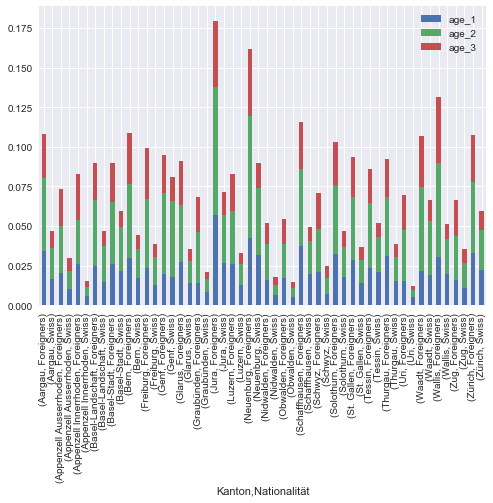

In [36]:
import matplotlib.pyplot as plt
plt.style.use('seaborn')
plot_age_nat.plot.bar(stacked=True)
plt.show()

## Röstigraben? Does it exist?

We find visual trends of the differences between Deutscheschweiz and the Suisse Romande/Ticino. Let's see it in a better way! Guess where the colours run deeper? It's more the French and Italian speaking parts. The Röstigraben, to some level does exist in this way. 

In [37]:
ch_fr_source = open('geojson/ch_french.geojson')
ch_fr_json = ch_fr_source.read()
ch_fr = json.loads(ch_fr_json)

ch_de_source = open('geojson/ch_german.geojson')
ch_de_json = ch_de_source.read()
ch_de = json.loads(ch_de_json)

ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)

#Add rate data to the map - for Swiss people
ch_map.choropleth(name = 'Unemployment rates (%) in the Franco/Italiano-phone Swiss cantons',
                  geo_data=ch_fr, 
                  data=ch_rate_data,
                  columns=['Kanton', 'rate_ue_2016'],
                  key_on='feature.properties.name',
                  fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
                  legend_name='Unemployment rate (%)'
                 )
ch_map.choropleth(name = 'Unemployment rates (%) in the Germanophone Swiss cantons',
                  geo_data=ch_de, 
                  data=ch_rate_data,
                  columns=['Kanton', 'rate_ue_2016'],
                  key_on='feature.properties.name',
                  fill_color='PuBu', fill_opacity=0.7, line_opacity=0.2,
                  legend_name='Unemployment rate (%)'
                 )
folium.LayerControl().add_to(ch_map)
ch_map

In [38]:
ch_fr_source = open('geojson/ch_french.geojson')
ch_fr_json = ch_fr_source.read()
ch_fr = json.loads(ch_fr_json)

ch_de_source = open('geojson/ch_german.geojson')
ch_de_json = ch_de_source.read()
ch_de = json.loads(ch_de_json)

ch_map = folium.Map(location=[46.8,8.1], zoom_start=7.5)

ch_map.choropleth(name = 'Unemployment rate - difference between Swiss and foreigners (%) (DE)',geo_data=ch_de, data=ch_difference_nat_data,
             columns=['Kanton', 'rate_ue_by_nat_2016'],
             key_on='feature.properties.name',
             fill_color='PuBu', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Unemployment rate - difference between Swiss and foreigners (%)')
ch_map.choropleth(name = 'Unemployment rate - difference between Swiss and foreigners (%) (FR/IT)',geo_data=ch_fr, data=ch_difference_nat_data,
             columns=['Kanton', 'rate_ue_by_nat_2016'],
             key_on='feature.properties.name',
             fill_color='OrRd', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Unemployment rate - difference between Swiss and foreigners (%)')
folium.LayerControl().add_to(ch_map)
ch_map

Neuchâtel seems to have it bad, and in general the areas which are at the border. They generally have many immigrant workers and often during times of recession, the workers who are let off first would be the immigrants to protect the jobs of the local Swiss people and hence it makes sense that the exterior areas (which are mostly French and Italian speaking) have more of discrepancies between Swiss and foreign workers. The German speaking cantons on the other hand are often deep inside the heart of the country and are not as such much easily preferred for immigrant workers to work. No wonder the SVP thrives there... 